In [27]:
#importing packages
import warnings
warnings.filterwarnings("ignore")

import pickle
import os
import random
import pandas as pd
import random as rn
import numpy as np
import tensorflow as tf
# tf.enable_eager_execution()

from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.regularizers import l1,l2
from tqdm import tqdm
import heapq
from sklearn.utils import shuffle
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import ast
from sklearn.model_selection import train_test_split

In [2]:
currentDirectory = "../"
dataDirectory = currentDirectory
imageDirectory = dataDirectory + "image_data/train2014/"
val_imageDirectory = dataDirectory + "image_data/val2014/"
test_imageDirectory = dataDirectory + "image_data/test2015/" 
img_width = 224
img_height = 224

BATCH_SIZE = 64
BUFFER_SIZE = 300

In [3]:
data = pd.read_csv(dataDirectory + 'image_text_data/train_image_text_data.csv')
val_data = pd.read_csv(dataDirectory + 'image_text_data/val_image_text_data.csv')
test_data = pd.read_csv(dataDirectory + 'image_text_data/test_image_text_data.csv')

In [4]:
data.dropna(inplace = True)
val_data.dropna(inplace = True)
test_data.dropna(inplace = True)

In [5]:
contractions = { 
"ain't": "am not","aren't": "are not","can't": "cannot","can't've": "cannot have","'cause": "because","could've": "could have","couldn't": "could not",
"couldn't've": "could not have","didn't": "did not","doesn't": "does not","don't": "do not","hadn't": "had not","hadn't've": "had not have",
"hasn't": "has not","haven't": "have not","he'd": "he would","he'd've": "he would have","he'll": "he will","he's": "he is","how'd": "how did",
"how'll": "how will","how's": "how is","i'd": "i would","i'll": "i will","i'm": "i am","i've": "i have","isn't": "is not","it'd": "it would",
"it'll": "it will","it's": "it is","let's": "let us","ma'am": "madam","mayn't": "may not","might've": "might have","mightn't": "might not",
"must've": "must have","mustn't": "must not","needn't": "need not","oughtn't": "ought not","shan't": "shall not","sha'n't": "shall not","she'd": "she would",
"she'll": "she will","she's": "she is","should've": "should have","shouldn't": "should not","that'd": "that would","that's": "that is","there'd": "there had",
"there's": "there is","they'd": "they would","they'll": "they will","they're": "they are","they've": "they have","wasn't": "was not","we'd": "we would",
"we'll": "we will","we're": "we are","we've": "we have","weren't": "were not","what'll": "what will","what're": "what are","what's": "what is",
"what've": "what have","where'd": "where did","where's": "where is","who'll": "who will","who's": "who is","won't": "will not","wouldn't": "would not",
"you'd": "you would","you'll": "you will","you're": "you are"
}

def preprocess_text(text):
    '''Given a text this function removes the punctuations and returns the remaining text string'''
    new_text = ""
    text = text.lower()
    i = 0
    for word in text.split():
        if i==0:
            new_text = contractions.get(word,word)
        else:
            new_text = new_text + " " + contractions.get(word,word)
        i += 1
    return new_text.replace("'s", '')

In [6]:
data['multiple_choice_answer'] = data['multiple_choice_answer'].apply(lambda x: preprocess_text(x))
val_data['multiple_choice_answer'] = val_data['multiple_choice_answer'].apply(lambda x: preprocess_text(x))

In [7]:
X_train = data
X_val = val_data
X_test = test_data

del data, val_data, test_data
len(X_train), len(X_val), len(X_test)

(443757, 214353, 447793)

In [8]:
all_classes = X_train['multiple_choice_answer'].values
class_frequency = {}

for _cls in all_classes:
    if(class_frequency.get(_cls,-1)>0):
        class_frequency[_cls] += 1
    else:
        class_frequency[_cls] = 1

In [9]:
common_tags = heapq.nlargest(1000, class_frequency, key = class_frequency.get)

In [10]:
# take the top 1000 classes
X_train['multiple_choice_answer'] =  X_train['multiple_choice_answer'].apply(lambda x: x if x in common_tags else '')

# removing question which has empty tags
X_train = X_train[X_train['multiple_choice_answer'].apply(lambda x: len(x)>0)]

In [11]:
label_encoder = LabelBinarizer()
answer_vector_train = label_encoder.fit_transform(X_train['multiple_choice_answer'].apply(lambda x: x).values)
answer_vector_val = label_encoder.transform(X_val['multiple_choice_answer'].apply(lambda x: x).values)

ans_vocab = {l: i for i, l in enumerate(label_encoder.classes_)}

print("Number of clasess: ", len(ans_vocab))
print("Shape of Answer Vectors in Train Data: ", answer_vector_train.shape)
print("Shape of Answer Vectors in Validation Data: ", answer_vector_val.shape)

Number of clasess:  1000
Shape of Answer Vectors in Train Data:  (388252, 1000)
Shape of Answer Vectors in Validation Data:  (214353, 1000)


### Question vectors

In [12]:
def preprocess_question(text):
    '''Given a text this function removes the punctuations and returns the remaining text string'''
    new_text = "<start>"
    text = text.lower()
    for word in text.split():
        new_text = new_text + " " + contractions.get(word, word)
    new_text = new_text + " <end>"
    return new_text.replace("'s", '')

In [13]:
X_train['question'] = X_train['question'].apply(lambda x: preprocess_question(x))
X_val['question'] = X_val['question'].apply(lambda x: preprocess_question(x))

In [14]:
#tokenization
tokenizer = tf.keras.preprocessing.text.Tokenizer(oov_token = "<unk>", filters = '!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(X_train['question'].values)
train_question_seqs = tokenizer.texts_to_sequences(X_train['question'].values)

print("Number of words in tokenizer:", len(tokenizer.word_index))
ques_vocab = tokenizer.word_index

question_vector_train = tf.keras.preprocessing.sequence.pad_sequences(train_question_seqs, padding='post')
print("Shape of Question Vectors in Train Data: ", question_vector_train.shape)

Number of words in tokenizer: 12450
Shape of Question Vectors in Train Data:  (388252, 24)


### Model


In [15]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (img_width, img_height))
    img = tf.keras.applications.vgg19.preprocess_input(img)
    img = img * (1./255)
    img = tf.expand_dims(img, axis=0)
    return img, image_path

def ResNet_Top():
    model = tf.keras.applications.ResNet50(include_top = False,
                                            weights="imagenet",
                                            input_shape = (img_width, img_height,3))
    
    input_layer = model.input
    hidden_layer = model.layers[-1].output 
    model = tf.keras.Model(input_layer, hidden_layer)
    return model

In [23]:
class CoattentionModel(tf.keras.layers.Layer):
    def __init__(self):#, num_embeddings, num_classes, embed_dim=512, k=30
        super().__init__()
        self.num_classes = len(ans_vocab)
        self.hidden_size = 512
        self.dropout = 0.3
        self.num_embeddings = len(ques_vocab) + 1

        self.image_dense = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_normal(seed=15)) 
        self.image_corr = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_normal(seed=29))

        self.image_atten_dense = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=17)) 
        self.question_atten_dens = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=28))
        self.question_atten_dropout = tf.keras.layers.Dropout(self.dropout)
        self.image_atten_dropout = tf.keras.layers.Dropout(self.dropout)

        self.ques_atten = tf.keras.layers.Dense(1, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=21))

        self.img_atten = tf.keras.layers.Dense(1, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=33))

        self.embed = tf.keras.layers.Embedding(self.num_embeddings, self.hidden_size,
                                               embeddings_initializer = tf.keras.initializers.RandomNormal(mean=0, stddev=1, seed=23))
        
        self.unigram_conv = tf.keras.layers.Conv1D(filters = self.hidden_size, kernel_size = 1, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed=41))
        self.bigram_conv  = tf.keras.layers.Conv1D(filters = self.hidden_size, kernel_size = 2, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed=58), dilation_rate = 2)
        self.trigram_conv = tf.keras.layers.Conv1D(filters = self.hidden_size, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed=89), dilation_rate = 2)
        self.max_pool = tf.keras.layers.MaxPool2D((3,1))
        self.phrase_dropout = tf.keras.layers.Dropout(self.dropout)
        
        self.lstm = tf.keras.layers.LSTM(units = 512 , return_sequences=True, dropout = self.dropout,
                                         kernel_initializer = tf.keras.initializers.glorot_uniform(seed=26),
                                         recurrent_initializer = tf.keras.initializers.orthogonal(seed=54))
        
        self.tanh = tf.keras.layers.Activation('tanh')
        self.softmax = tf.keras.layers.Activation('softmax')
        
        self.W_w_dropout = tf.keras.layers.Dropout(self.dropout)
        self.W_p_dropout = tf.keras.layers.Dropout(self.dropout)
        self.W_s_dropout = tf.keras.layers.Dropout(self.dropout)

        self.W_w = tf.keras.layers.Dense(units = self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=32), input_shape = (self.hidden_size,))
        self.W_p = tf.keras.layers.Dense(units = self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=49), input_shape = (2 * self.hidden_size, ))
        self.W_s = tf.keras.layers.Dense(units = self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=31), input_shape = (2 * self.hidden_size, ))
        
        self.fc1_Dense = tf.keras.layers.Dense(units = 2 * self.hidden_size, activation='relu',
                                               kernel_initializer = tf.keras.initializers.he_normal(seed=84))
        self.fc1_dropout = tf.keras.layers.Dropout(self.dropout)

        self.fc = tf.keras.layers.Dense(units = self.num_classes, activation='softmax',kernel_initializer = tf.keras.initializers.glorot_uniform(seed=91), input_shape = (self.hidden_size,))
        
        return

    def call(self, image, question):#Image: B x 196 x 512
        
        image = self.image_dense(image)
        image = self.tanh(image)

        words = self.embed(question)    # Words: B x L x 51

        unigrams =  tf.expand_dims(self.tanh(self.unigram_conv(words)), 1) # B x L x 512
        bigrams  =  tf.expand_dims(self.tanh(self.bigram_conv(words)), 1)  # B x L x 512
        trigrams =  tf.expand_dims(self.tanh(self.trigram_conv(words)), 1) # B x L x 512

        phrase = tf.squeeze(self.max_pool(tf.concat((unigrams, bigrams, trigrams), 1)), axis=1)  # B x L x 512
        phrase = self.tanh(phrase)
        phrase = self.phrase_dropout(phrase)
  
        hidden = None
        sentence = self.lstm(phrase)        # B x L x 512   

        v_word, q_word = self.co_attention(image, words)
        v_phrase, q_phrase = self.co_attention(image, phrase)
        v_sent, q_sent = self.co_attention(image, sentence)

        h_w = self.tanh(self.W_w(self.W_w_dropout(q_word + v_word)))
        h_p = self.tanh(self.W_p(self.W_p_dropout(tf.concat(((q_phrase + v_phrase), h_w), axis=1))))
        h_s = self.tanh(self.W_s(self.W_s_dropout(tf.concat(((q_sent + v_sent), h_p), axis=1))))

        fc1 = self.fc1_Dense(self.fc1_dropout(h_s))
        logits = self.fc(fc1)

        return logits

    def co_attention(self, img_feat, ques_feat):  # V : B x 512 x 196, Q : B x L x 512
        img_corr = self.image_corr(img_feat)

        weight_matrix = tf.keras.backend.batch_dot(ques_feat, img_corr, axes = (2, 2))
        weight_matrix = self.tanh(weight_matrix)

        ques_embed = self.image_atten_dense(ques_feat)
        img_embed = self.question_atten_dens(img_feat)

        transform_img = tf.keras.backend.batch_dot(weight_matrix, img_embed)

        ques_atten_sum = self.tanh(transform_img + ques_embed)
        ques_atten_sum = self.question_atten_dropout(ques_atten_sum)
        ques_atten = self.ques_atten(ques_atten_sum)
        ques_atten =  tf.keras.layers.Reshape((ques_atten.shape[1],))(ques_atten)
        ques_atten =  self.softmax(ques_atten)

        transform_ques = tf.keras.backend.batch_dot(weight_matrix, ques_embed, axes = (1, 1))
        img_atten_sum = self.tanh(transform_ques+img_embed)
        img_atten_sum = self.image_atten_dropout(img_atten_sum)
        img_atten = self.img_atten(img_atten_sum)
        img_atten = tf.keras.layers.Reshape((img_atten.shape[1],))(img_atten)
        img_atten = self.softmax(img_atten)

        ques_atten = tf.keras.layers.Reshape(( 1, ques_atten.shape[1]))(ques_atten)
        img_atten = tf.keras.layers.Reshape(( 1, img_atten.shape[1]))(img_atten)

        ques_atten_feat = tf.keras.backend.batch_dot(ques_atten,ques_feat)
        ques_atten_feat = tf.keras.layers.Reshape(( ques_atten_feat.shape[-1],))(ques_atten_feat)

        img_atten_feat =  tf.keras.backend.batch_dot(img_atten, img_feat)
        img_atten_feat = tf.keras.layers.Reshape((img_atten_feat.shape[-1],))(img_atten_feat)

        return img_atten_feat, ques_atten_feat
    
def Build_CoattentionModel():
    image_input1 = tf.keras.layers.Input(shape = (7, 7, 2048))
    image_input = tf.keras.layers.Reshape((-1, 2048))(image_input1)

    question_input = tf.keras.layers.Input(shape=(question_vector_train.shape[1],))

    output = CoattentionModel()(image_input, question_input)#num_embeddings = len(ques_vocab), num_classes = len(ans_vocab), embed_dim = 512

    model = tf.keras.models.Model(inputs = [image_input1, question_input], outputs = output)
    return model

In [17]:
class ImageAttentionModel(tf.keras.layers.Layer):
    def __init__(self):#, num_embeddings, num_classes, embed_dim=512, k=30
        super().__init__()
        self.num_classes = len(ans_vocab)
        self.hidden_size = 256
        self.dropout = 0.3
        self.num_embeddings = len(ques_vocab) + 1
        
        self.image_dense = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_normal(seed=15)) 
        self.image_corr = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_normal(seed=29))
        
        self.ques_flat = tf.keras.layers.Flatten()
        self.ques_corr2 = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_normal(seed=29))
        self.tanh2 = tf.keras.layers.Activation('tanh')

        self.image_atten_dense = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=17)) 
        self.question_atten_dens = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=28))
        self.question_atten_dropout = tf.keras.layers.Dropout(self.dropout)
        self.image_atten_dropout = tf.keras.layers.Dropout(self.dropout)

        self.ques_atten = tf.keras.layers.Dense(1, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=21))

        self.img_atten = tf.keras.layers.Dense(1, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=33))

        self.embed = tf.keras.layers.Embedding(self.num_embeddings, self.hidden_size,
                                               embeddings_initializer = tf.keras.initializers.RandomNormal(mean=0, stddev=1, seed=23))
        
        self.unigram_conv = tf.keras.layers.Conv1D(filters = self.hidden_size, kernel_size = 1, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed=41))
        self.bigram_conv  = tf.keras.layers.Conv1D(filters = self.hidden_size, kernel_size = 2, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed=58), dilation_rate = 2)
        self.trigram_conv = tf.keras.layers.Conv1D(filters = self.hidden_size, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed=89), dilation_rate = 2)
        self.max_pool = tf.keras.layers.MaxPool2D((3,1))
        self.phrase_dropout = tf.keras.layers.Dropout(self.dropout)
        
        self.lstm = tf.keras.layers.LSTM(units = 256 , return_sequences=True, dropout = self.dropout,
                                         kernel_initializer = tf.keras.initializers.glorot_uniform(seed=26),
                                         recurrent_initializer = tf.keras.initializers.orthogonal(seed=54))
        
        self.tanh = tf.keras.layers.Activation('tanh')
        self.softmax = tf.keras.layers.Activation('softmax')
        
        self.W_w_dropout = tf.keras.layers.Dropout(self.dropout)
        self.W_p_dropout = tf.keras.layers.Dropout(self.dropout)
        self.W_s_dropout = tf.keras.layers.Dropout(self.dropout)

        self.W_w = tf.keras.layers.Dense(units = self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=32), input_shape = (self.hidden_size,))
        self.W_p = tf.keras.layers.Dense(units = self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=49), input_shape = (2 * self.hidden_size, ))
        self.W_s = tf.keras.layers.Dense(units = self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=31), input_shape = (2 * self.hidden_size, ))
        
        self.fc1_Dense = tf.keras.layers.Dense(units = 2 * self.hidden_size, activation='relu',
                                               kernel_initializer = tf.keras.initializers.he_normal(seed=84))
        self.fc1_dropout = tf.keras.layers.Dropout(self.dropout)

        self.fc = tf.keras.layers.Dense(units = self.num_classes, activation='softmax',kernel_initializer = tf.keras.initializers.glorot_uniform(seed=91), input_shape = (self.hidden_size,))
        
        return

    def call(self, image, question):#Image: B x 196 x 512
        
        image = self.image_dense(image)
        image = self.tanh(image)

        # Q_w
        words = self.embed(question)    # Words: B x L x 51

        unigrams =  tf.expand_dims(self.tanh(self.unigram_conv(words)), 1) # B x L x 512
        bigrams  =  tf.expand_dims(self.tanh(self.bigram_conv(words)), 1)  # B x L x 512
        trigrams =  tf.expand_dims(self.tanh(self.trigram_conv(words)), 1) # B x L x 512

        phrase = tf.squeeze(self.max_pool(tf.concat((unigrams, bigrams, trigrams), 1)), axis=1)  # B x L x 512
        phrase = self.tanh(phrase)
        phrase = self.phrase_dropout(phrase)
  
        hidden = None
        sentence = self.lstm(phrase)        # B x L x 512   

        v_word, q_word = self.co_attention(image, words)
        v_phrase, q_phrase = self.co_attention(image, phrase)
        v_sent, q_sent = self.co_attention(image, sentence)

        h_w = self.tanh(self.W_w(self.W_w_dropout(q_word + v_word)))
        h_p = self.tanh(self.W_p(self.W_p_dropout(tf.concat(((q_phrase + v_phrase), h_w), axis=1))))
        h_s = self.tanh(self.W_s(self.W_s_dropout(tf.concat(((q_sent + v_sent), h_p), axis=1))))

        fc1 = self.fc1_Dense(self.fc1_dropout(h_s))
        logits = self.fc(fc1)

        return logits

    def co_attention(self, img_feat, ques_feat):  # V : B x 512 x 196, Q : B x L x 512
        img_corr = self.image_corr(img_feat)
        
        # C
        weight_matrix = tf.keras.backend.batch_dot(ques_feat, img_corr, axes = (2, 2))
        weight_matrix = self.tanh(weight_matrix)

        ques_embed = self.image_atten_dense(ques_feat)
        img_embed = self.question_atten_dens(img_feat)

        transform_img = tf.keras.backend.batch_dot(weight_matrix, img_embed)

        # Image attention map
        transform_ques = tf.keras.backend.batch_dot(weight_matrix, ques_embed, axes = (1, 1))
        img_atten_sum = self.tanh(transform_ques + img_embed)
        img_atten_sum = self.image_atten_dropout(img_atten_sum)
        img_atten = self.img_atten(img_atten_sum)
        img_atten = tf.keras.layers.Reshape((img_atten.shape[1],))(img_atten)
        img_atten = self.softmax(img_atten)

        img_atten = tf.keras.layers.Reshape(( 1, img_atten.shape[1]))(img_atten)

        # Image attention
        img_atten_feat =  tf.keras.backend.batch_dot(img_atten, img_feat)
        img_atten_feat = tf.keras.layers.Reshape((img_atten_feat.shape[-1],))(img_atten_feat)

        ques_flat = self.ques_flat(ques_feat)
        ques_atten_feat = self.ques_corr2(ques_flat)
        ques_atten_feat = self.tanh2(ques_atten_feat)

        return img_atten_feat, ques_atten_feat
    
def Build_ImageAttentionModel():
    image_input1 = tf.keras.layers.Input(shape = (7, 7, 2048))
    image_input = tf.keras.layers.Reshape((-1, 2048))(image_input1)

    question_input = tf.keras.layers.Input(shape=(question_vector_train.shape[1],))

    output = ImageAttentionModel()(image_input, question_input)#num_embeddings = len(ques_vocab), num_classes = len(ans_vocab), embed_dim = 512

    model = tf.keras.models.Model(inputs = [image_input1, question_input], outputs = output)

    return model

In [18]:
class QuesAttentionModel(tf.keras.layers.Layer):
    def __init__(self):#, num_embeddings, num_classes, embed_dim=512, k=30
        super().__init__()
        self.num_classes = len(ans_vocab)
        self.hidden_size = 256
        self.dropout = 0.3
        self.num_embeddings = len(ques_vocab) + 1
        
        self.image_flat = tf.keras.layers.Flatten()

        self.image_dense = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_normal(seed=15)) 
        self.image_corr = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_normal(seed=29))
        
        self.image_corr2 = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_normal(seed=29))
        self.tanh2 = tf.keras.layers.Activation('tanh')

        self.image_atten_dense = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=17)) 
        self.question_atten_dens = tf.keras.layers.Dense(self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=28))
        self.question_atten_dropout = tf.keras.layers.Dropout(self.dropout)
        self.image_atten_dropout = tf.keras.layers.Dropout(self.dropout)

        self.ques_atten = tf.keras.layers.Dense(1, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=21))

        self.img_atten = tf.keras.layers.Dense(1, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=33))

        self.embed = tf.keras.layers.Embedding(self.num_embeddings, self.hidden_size,
                                               embeddings_initializer = tf.keras.initializers.RandomNormal(mean=0, stddev=1, seed=23))
        
        self.unigram_conv = tf.keras.layers.Conv1D(filters = self.hidden_size, kernel_size = 1, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed=41))
        self.bigram_conv  = tf.keras.layers.Conv1D(filters = self.hidden_size, kernel_size = 2, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed=58), dilation_rate = 2)
        self.trigram_conv = tf.keras.layers.Conv1D(filters = self.hidden_size, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed=89), dilation_rate = 2)
        self.max_pool = tf.keras.layers.MaxPool2D((3,1))
        self.phrase_dropout = tf.keras.layers.Dropout(self.dropout)
        
        self.lstm = tf.keras.layers.LSTM(units = 256 , return_sequences=True, dropout = self.dropout,
                                         kernel_initializer = tf.keras.initializers.glorot_uniform(seed=26),
                                         recurrent_initializer = tf.keras.initializers.orthogonal(seed=54))
        
        self.tanh = tf.keras.layers.Activation('tanh')
        self.softmax = tf.keras.layers.Activation('softmax')
        
        self.W_w_dropout = tf.keras.layers.Dropout(self.dropout)
        self.W_p_dropout = tf.keras.layers.Dropout(self.dropout)
        self.W_s_dropout = tf.keras.layers.Dropout(self.dropout)

        self.W_w = tf.keras.layers.Dense(units = self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=32), input_shape = (self.hidden_size,))
        self.W_p = tf.keras.layers.Dense(units = self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=49), input_shape = (2 * self.hidden_size, ))
        self.W_s = tf.keras.layers.Dense(units = self.hidden_size, kernel_initializer = tf.keras.initializers.glorot_uniform(seed=31), input_shape = (2 * self.hidden_size, ))
        
        self.fc1_Dense = tf.keras.layers.Dense(units = 2 * self.hidden_size, activation='relu',
                                               kernel_initializer = tf.keras.initializers.he_normal(seed=84))
        self.fc1_dropout = tf.keras.layers.Dropout(self.dropout)

        self.fc = tf.keras.layers.Dense(units = self.num_classes, activation='softmax',kernel_initializer = tf.keras.initializers.glorot_uniform(seed=91), input_shape = (self.hidden_size,))
        
        return

    def call(self, image, question):#Image: B x 196 x 512
        
        image = self.image_dense(image)
        image = self.tanh(image)

        # Q_w
        words = self.embed(question)    # Words: B x L x 51

        unigrams =  tf.expand_dims(self.tanh(self.unigram_conv(words)), 1) # B x L x 512
        bigrams  =  tf.expand_dims(self.tanh(self.bigram_conv(words)), 1)  # B x L x 512
        trigrams =  tf.expand_dims(self.tanh(self.trigram_conv(words)), 1) # B x L x 512

        phrase = tf.squeeze(self.max_pool(tf.concat((unigrams, bigrams, trigrams), 1)), axis=1)  # B x L x 512
        phrase = self.tanh(phrase)
        phrase = self.phrase_dropout(phrase)
  
        hidden = None
        sentence = self.lstm(phrase)        # B x L x 512   

        v_word, q_word = self.co_attention(image, words)
        v_phrase, q_phrase = self.co_attention(image, phrase)
        v_sent, q_sent = self.co_attention(image, sentence)

        h_w = self.tanh(self.W_w(self.W_w_dropout(q_word + v_word)))
        h_p = self.tanh(self.W_p(self.W_p_dropout(tf.concat(((q_phrase + v_phrase), h_w), axis=1))))
        h_s = self.tanh(self.W_s(self.W_s_dropout(tf.concat(((q_sent + v_sent), h_p), axis=1))))

        fc1 = self.fc1_Dense(self.fc1_dropout(h_s))
        logits = self.fc(fc1)

        return logits

    def co_attention(self, img_feat, ques_feat):  # V : B x 512 x 196, Q : B x L x 512
        img_corr = self.image_corr(img_feat)
        
        # C
        weight_matrix = tf.keras.backend.batch_dot(ques_feat, img_corr, axes = (2, 2))
        weight_matrix = self.tanh(weight_matrix)

        ques_embed = self.image_atten_dense(ques_feat)
        img_embed = self.question_atten_dens(img_feat)

        transform_img = tf.keras.backend.batch_dot(weight_matrix, img_embed)

        # Question attention map
        ques_atten_sum = self.tanh(transform_img + ques_embed)
        ques_atten_sum = self.question_atten_dropout(ques_atten_sum)
        ques_atten = self.ques_atten(ques_atten_sum)
        ques_atten =  tf.keras.layers.Reshape((ques_atten.shape[1],))(ques_atten)
        ques_atten =  self.softmax(ques_atten)

        ques_atten = tf.keras.layers.Reshape(( 1, ques_atten.shape[1]))(ques_atten)

        # Question attention
        ques_atten_feat = tf.keras.backend.batch_dot(ques_atten, ques_feat)
        ques_atten_feat = tf.keras.layers.Reshape(( ques_atten_feat.shape[-1],))(ques_atten_feat)

        img_flat = self.image_flat(img_corr)
        img_atten_feat = self.image_corr2(img_flat)
        img_atten_feat = self.tanh2(img_atten_feat)

        return img_atten_feat, ques_atten_feat
    
def Build_QuesAttentionModel():
    image_input1 = tf.keras.layers.Input(shape = (7, 7, 2048))
    image_input = tf.keras.layers.Reshape((-1, 2048))(image_input1)

    question_input = tf.keras.layers.Input(shape=(question_vector_train.shape[1],))

    output = QuesAttentionModel()(image_input, question_input)#num_embeddings = len(ques_vocab), num_classes = len(ans_vocab), embed_dim = 512

    model = tf.keras.models.Model(inputs = [image_input1, question_input], outputs = output)

    return model

In [19]:
def generate_on_test(model):
    random.seed(42)
    test_idx = np.random.randint(len(X_val), size = 20)
    model_vgg = ResNet_Top()
    k = 5

    for idx in test_idx:
        test_image_id = X_test['image_id'].values[idx]
        test_question = X_test['question'].values[idx]
        test_image_path = test_imageDirectory + 'COCO_test2015_' + '%012d.jpg' % (test_image_id)

        test_image_features = model_vgg(load_image(test_image_path)[0], 0)
        test_question_features = tf.keras.preprocessing.sequence.pad_sequences(tokenizer.texts_to_sequences([test_question]),padding='post',
                                                                               maxlen=question_vector_train.shape[1])
        y_pred = model.predict([test_image_features,test_question_features])

        class_indices = tf.math.top_k(y_pred,k=k).indices.numpy()
        percentages = tf.math.top_k(y_pred,k=k).values.numpy()[0] * 100
        predictions = []
        for idx,i in enumerate(class_indices[0]):
            classes = np.zeros((1,1000))
            classes[0][i] = 1
            predictions.append((label_encoder.inverse_transform(classes)[0],percentages[idx]))

        img = mpimg.imread(test_image_path)
        imgplot = plt.imshow(img)
        plt.axis('off')
        plt.show()

        print("Question :", test_question.replace("<start> ","").replace(" <end>",""))
        print("Top Predicted answers: ",predictions)
        print("*"*100)

In [20]:
def generate_on_val(model):
    random.seed(42)
    test_idx = np.random.randint(len(X_val), size = 20)
    model_vgg = ResNet_Top()
    k = 5

    for idx in test_idx:
        test_image_id = X_val['image_id'].values[idx]
        test_question = X_val['question'].values[idx]
        actual_answer = X_val['multiple_choice_answer'].values[idx]
        test_image_path = val_imageDirectory + 'COCO_val2014_' + '%012d.jpg' % (test_image_id)

        test_image_features = model_vgg(load_image(test_image_path)[0], 0)
        test_question_features = tf.keras.preprocessing.sequence.pad_sequences(tokenizer.texts_to_sequences([test_question]),padding='post',
                                                                               maxlen=question_vector_train.shape[1])
        y_pred = model.predict([test_image_features,test_question_features])

        class_indices = tf.math.top_k(y_pred,k=k).indices.numpy()
        percentages = tf.math.top_k(y_pred,k=k).values.numpy()[0] * 100
        predictions = []
        for idx,i in enumerate(class_indices[0]):
            classes = np.zeros((1,1000))
            classes[0][i] = 1
            predictions.append((label_encoder.inverse_transform(classes)[0],percentages[idx]))

        img = mpimg.imread(test_image_path)
        imgplot = plt.imshow(img)
        plt.axis('off')
        plt.show()

        print("Question :", test_question.replace("<start> ","").replace(" <end>",""))
        print("Actual Answer: ", actual_answer)
        print("Top Predicted answers: ",predictions)
        print("*"*100)

In [ ]:
image_paths_train = X_train['image_id'].apply(lambda x:  imageDirectory + 'COCO_train2014_' + '%012d.jpg' % (x)).values
image_paths_val = X_val['image_id'].apply(lambda x:  val_imageDirectory + 'COCO_val2014_' + '%012d.jpg' % (x)).values

with open(dataDirectory + 'features_files/train_image_dict_resnet.pickle', 'rb') as handle:
    all_image_dict = pickle.load(handle)
    
with open(dataDirectory + 'features_files/val_image_dict_resnet.pickle', 'rb') as handle:
    val_image_dict = pickle.load(handle)
    
all_image_dict.update(val_image_dict)
del val_image_dict

kv = list(all_image_dict.items())
all_image_dict.clear()

for k, v in kv:
    new_key = "." + k
    all_image_dict[new_key] = v
    
def get_imageTensor(img, ques, qtype, answer,atype,answers):
    img_tensor = all_image_dict[img.decode('utf-8')]
    img_tensor = tf.squeeze(img_tensor)
    return img_tensor, ques, qtype, answer, atype, answers

def createDataset(image_paths,question_vector,question_type,answer_vector,answer_type,answers):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, question_vector.astype(np.float32), question_type,answer_vector,answer_type,answers))

    # using map to load the numpy files in parallel
    dataset = dataset.map(lambda img, ques, qtype, answer, atype,answers : tf.numpy_function(get_imageTensor, [img, ques, qtype, answer, atype,answers], 
                                                                                     [tf.float32, tf.float32, tf.string, tf.int64, tf.string,tf.string]),
                                      num_parallel_calls = tf.data.experimental.AUTOTUNE)
    # shuffling and batching
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size = tf.data.experimental.AUTOTUNE)

    return dataset

# image_paths_val = X_val['image_id'].apply(lambda x:  val_imageDirectory + 'COCO_val2014_' + '%012d.jpg' % (x)).values
answer_vector_val = label_encoder.transform(X_val['multiple_choice_answer'].apply(lambda x: x).values)
# answer_vector_val = answer_vector_val.toarray()
answer_type = X_val['answer_type'].values 
answers = X_val['answers'].values

val_question_seqs = tokenizer.texts_to_sequences(X_val['question'].values)
question_vector_val = tf.keras.preprocessing.sequence.pad_sequences(val_question_seqs,padding='post',maxlen=24)

question_type = X_val['question_type'].values 

dataset_val = createDataset(image_paths_val, question_vector_val, question_type, answer_vector_val,answer_type,answers)



def model_metric(predictions, truths):
    total = 0
    correct_val = 0.0
    for prediction, truth in tqdm(zip(predictions, truths)):
        truth = ast.literal_eval(truth.numpy().decode('utf-8'))#json.loads(truth.numpy().decode('utf-8').replace("\'", "\""))
        prediction = label_encoder.inverse_transform(np.array([prediction]))[0]
        temp_count = 0
        total += 1
        for _truth in truth:
            if prediction == _truth['answer']:
                temp_count += 1
        # accuracy = min((# humans that provided that answer/3) , 1)
        if temp_count > 2:
            correct_val += 1
        else:
            correct_val += float(temp_count) / 3
    return (correct_val / total)*100

def print_accuracy_metrics(model):
    error_dict = {  _qtype : { 'top_1' : 0,'top_2' : 0,'top_3' : 0 ,'top_5' : 0,'count' : 0 } for _qtype in np.unique(question_type) }
    actual_list = []
    pred_list = []

    for (batch, (img_tensor, question, qtype, answer,atype,answers)) in tqdm(enumerate(dataset_val)):
        y_pred = model.predict([img_tensor,question])

        for i in range(y_pred.shape[0]):
            _qtype = qtype[i].numpy().decode('utf-8')
            _atype = atype[i].numpy().decode('utf-8')
            error_dict[_qtype]['count'] += 1 

            for _k in [1]:#[1,2,3,5]:
                if _atype == 'yes/no' and _k > 1:
                    top_k = tf.math.top_k(y_pred, k = 1).indices.numpy()[i]
                else:
                    top_k = tf.math.top_k(y_pred, k = _k).indices.numpy()[i]

                pred_classes = np.zeros(y_pred.shape[1])
                pred_classes[top_k] = 1
                actual_list.append(answers[i])
                pred_list.append(pred_classes)
                
    print("Accuracy : " + str(model_metric(pred_list, actual_list)))


### Co-attention

In [24]:
model = Build_CoattentionModel()
model.load_weights('/home/divyaj/Plots/models/resnet/coatten.hdf5')

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


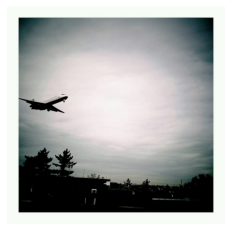

Question : What is flying in this picture?
Top Predicted answers:  [('kite', 27.025986), ('kites', 26.435125), ('plane', 15.07042), ('airplane', 9.613873), ('frisbee', 7.075037)]
****************************************************************************************************


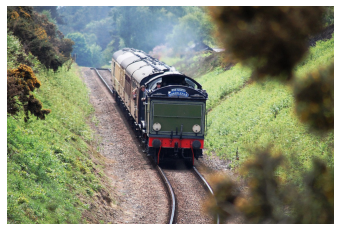

Question : What color is the train?
Top Predicted answers:  [('red', 23.116161), ('yellow', 18.040712), ('blue', 10.08101), ('green', 9.173083), ('white', 8.994066)]
****************************************************************************************************


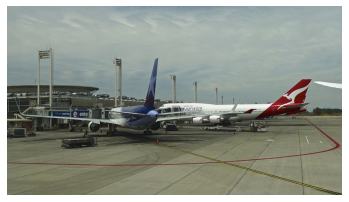

Question : How many planes can be seen?
Top Predicted answers:  [('2', 30.409618), ('1', 21.19663), ('3', 17.784088), ('4', 12.107329), ('5', 6.09321)]
****************************************************************************************************


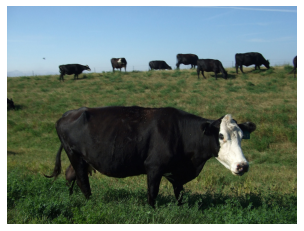

Question : Is the cow white?
Top Predicted answers:  [('no', 8.607356), ('yes', 8.428543), ('black and white', 7.651651), ('brown', 4.2449245), ('brown and white', 3.9448786)]
****************************************************************************************************


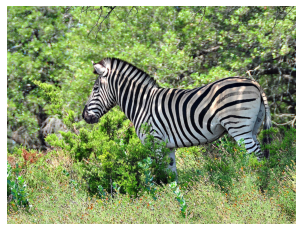

Question : Is the zebra in the wild?
Top Predicted answers:  [('zoo', 40.259686), ('africa', 10.15613), ('wild', 8.509363), ('field', 7.2455654), ('fence', 4.2307587)]
****************************************************************************************************


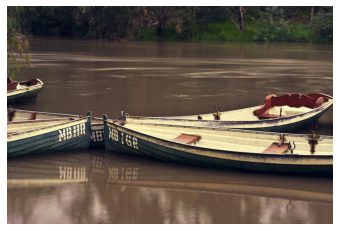

Question : Did these boats crash?
Top Predicted answers:  [('no', 43.94179), ('yes', 28.403225), ('beach', 1.7696766), ('plane', 1.29176), ('ramp', 1.1928834)]
****************************************************************************************************


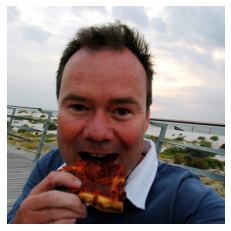

Question : What is the man eating?
Top Predicted answers:  [('donut', 18.389006), ('pizza', 15.566895), ('hot dog', 14.171258), ('cake', 11.142662), ('sandwich', 7.4972777)]
****************************************************************************************************


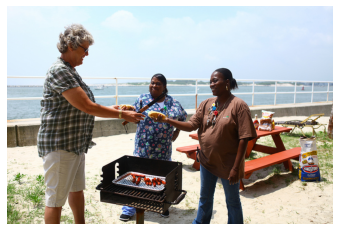

Question : Is the woman wearing scrubs?
Top Predicted answers:  [('shorts', 5.2122035), ('suit', 5.05804), ('wetsuit', 4.901168), ('tank top', 4.891155), ('dress', 4.0762606)]
****************************************************************************************************


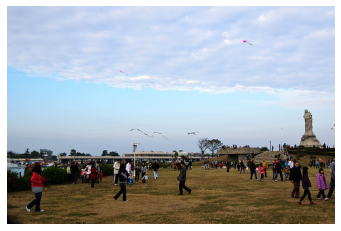

Question : Is this indoors?
Top Predicted answers:  [('ocean', 22.099396), ('lake', 15.475638), ('river', 8.601042), ('boat', 7.367736), ('no', 7.2057204)]
****************************************************************************************************


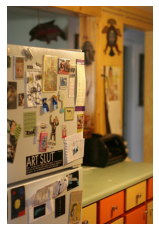

Question : Is this a kitchen?
Top Predicted answers:  [('yes', 50.768204), ('no', 42.880405), ('0', 0.5934623), ('bathroom', 0.55195934), ('white', 0.3450001)]
****************************************************************************************************


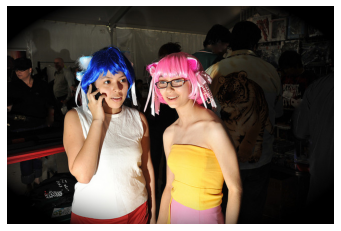

Question : Are these girls out in public?
Top Predicted answers:  [('yes', 37.40844), ('no', 37.23091), ('bathroom', 1.7995007), ('train', 1.1205697), ('plane', 1.1194397)]
****************************************************************************************************


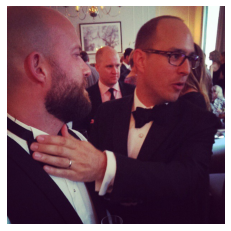

Question : How many bow ties can be seen?
Top Predicted answers:  [('1', 21.812885), ('2', 20.133595), ('0', 18.459084), ('3', 12.512171), ('4', 7.5427794)]
****************************************************************************************************


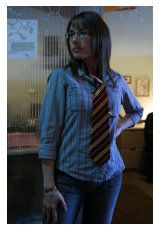

Question : Are all these people outside?
Top Predicted answers:  [('yes', 51.45249), ('no', 47.58941), ('1', 0.10231427), ('0', 0.08498426), ('2', 0.07449771)]
****************************************************************************************************


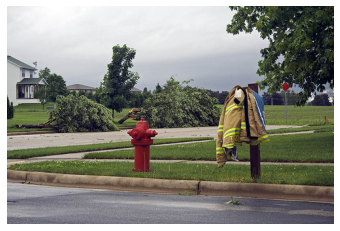

Question : Where did the fireman go?
Top Predicted answers:  [('nowhere', 6.799595), ('wall', 6.448077), ('kitchen', 5.2698793), ('outside', 4.5871096), ('beach', 4.3510747)]
****************************************************************************************************


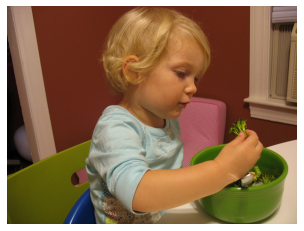

Question : What color is the green bowl?
Top Predicted answers:  [('white', 38.15172), ('blue', 9.795997), ('green', 7.03481), ('red', 6.2098174), ('brown', 6.1270967)]
****************************************************************************************************


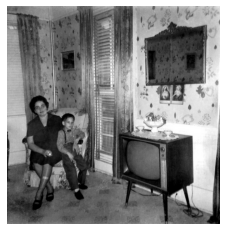

Question : What is on the chair?
Top Predicted answers:  [('cat', 10.679008), ('dog', 6.4958797), ('nothing', 5.5456357), ('teddy bear', 5.1880527), ('flowers', 4.31849)]
****************************************************************************************************


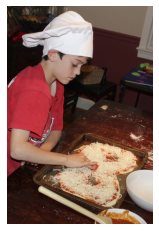

Question : Does the chef cover his hair?
Top Predicted answers:  [('yes', 46.2062), ('no', 41.329796), ('ponytail', 1.9975817), ('straight', 1.198369), ('headband', 1.0085342)]
****************************************************************************************************


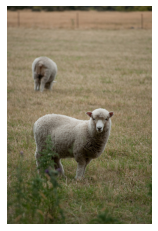

Question : Do these animals have enough to eat?
Top Predicted answers:  [('yes', 56.54533), ('no', 42.39147), ('1', 0.2609774), ('2', 0.23695867), ('0', 0.09108932)]
****************************************************************************************************


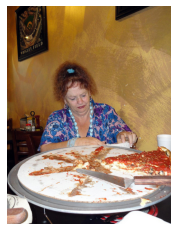

Question : What is the picture of in the back?
Top Predicted answers:  [('trees', 3.433013), ('mountains', 2.6680315), ('fence', 2.4530122), ('building', 2.353834), ('water', 2.1099904)]
****************************************************************************************************


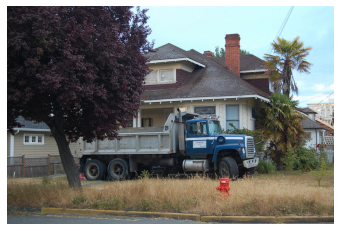

Question : What color is the cab of the truck?
Top Predicted answers:  [('white', 29.464516), ('red', 19.353985), ('yellow', 19.220375), ('blue', 14.192086), ('green', 7.9855485)]
****************************************************************************************************


In [28]:
generate_on_test(model)

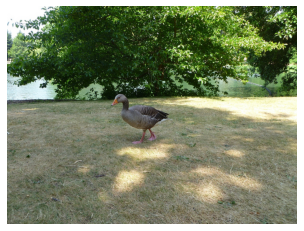

Question : is this a duck family?
Actual Answer:  no
Top Predicted answers:  [('no', 55.094242), ('yes', 44.905758), ('winter', 3.7925233e-07), ('summer', 2.9132798e-07), ('pizza', 2.5974782e-07)]
****************************************************************************************************


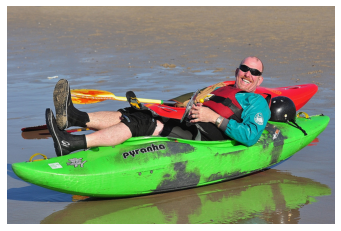

Question : what is the name on the side of the kayak?
Actual Answer:  pyranha
Top Predicted answers:  [('none', 31.550879), ('ford', 12.854552), ('coca cola', 9.411177), ('mercedes', 6.1894474), ('honda', 5.130954)]
****************************************************************************************************


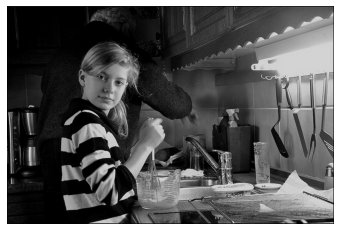

Question : what is printed on the girls shirt?
Actual Answer:  stripes
Top Predicted answers:  [('nothing', 20.056236), ('words', 7.35382), ('star', 5.3979416), ('stripes', 4.674352), ('none', 3.6959805)]
****************************************************************************************************


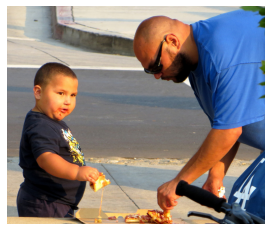

Question : is this a professional chef?
Actual Answer:  no
Top Predicted answers:  [('no', 58.418476), ('yes', 41.581528), ('winter', 6.781312e-08), ('summer', 5.12703e-08), ('pizza', 1.8741192e-08)]
****************************************************************************************************


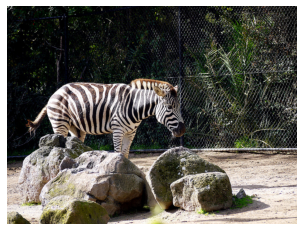

Question : how many boulders are there?
Actual Answer:  3
Top Predicted answers:  [('2', 15.56903), ('1', 14.248519), ('3', 12.9729805), ('0', 10.338331), ('4', 10.162908)]
****************************************************************************************************


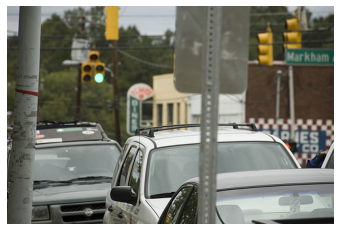

Question : why cannot the nearest sign be read?
Actual Answer:  backwards
Top Predicted answers:  [('stop', 6.7746034), ('nothing', 4.1541886), ('crosswalk', 3.3185368), ('parking', 3.2715156), ('none', 3.0199604)]
****************************************************************************************************


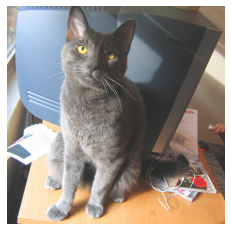

Question : what is the cat standing directly in front of?
Actual Answer:  monitor
Top Predicted answers:  [('chair', 8.357687), ('car', 8.212497), ('bench', 4.9037776), ('window', 4.699128), ('suitcase', 4.6381516)]
****************************************************************************************************


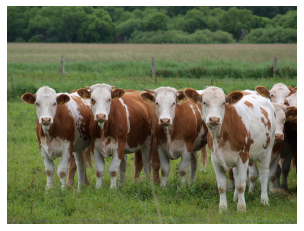

Question : how many cows are in this image?
Actual Answer:  7
Top Predicted answers:  [('2', 17.398037), ('3', 14.890612), ('4', 12.829423), ('1', 12.146903), ('5', 8.009999)]
****************************************************************************************************


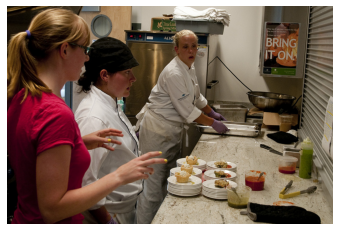

Question : what does the sign request the viewer to "bring on?"?
Actual Answer:  it
Top Predicted answers:  [('stop', 28.159946), ('one way', 6.457714), ('no parking', 3.846874), ('stop sign', 3.6761231), ('nothing', 3.4170582)]
****************************************************************************************************


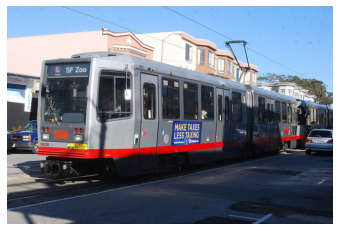

Question : what colors are the train?
Actual Answer:  gray and red
Top Predicted answers:  [('red', 13.3865595), ('yellow', 11.064504), ('white', 10.377718), ('blue', 7.9999394), ('green', 5.940882)]
****************************************************************************************************


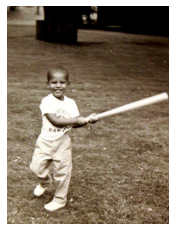

Question : is the boy blond?
Actual Answer:  no
Top Predicted answers:  [('no', 54.91638), ('yes', 45.083614), ('closed', 1.1716933e-06), ('surfing', 5.1098624e-07), ('open', 3.8098852e-07)]
****************************************************************************************************


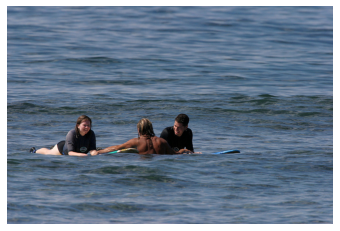

Question : do both young men have surfboards?
Actual Answer:  yes
Top Predicted answers:  [('no', 55.80155), ('yes', 44.197758), ('surfing', 5.9409216e-05), ('plane', 3.8913535e-05), ('kites', 3.4279234e-05)]
****************************************************************************************************


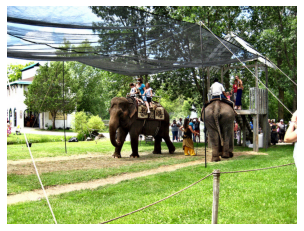

Question : how many horses are in this picture?
Actual Answer:  0
Top Predicted answers:  [('2', 27.43126), ('3', 17.837234), ('1', 16.020935), ('4', 12.982684), ('5', 7.208015)]
****************************************************************************************************


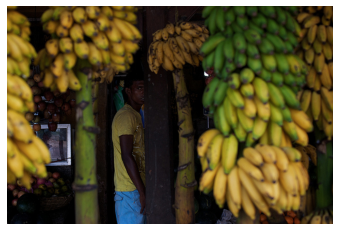

Question : is the fruit ripe?
Actual Answer:  yes
Top Predicted answers:  [('yes', 65.678665), ('no', 34.32134), ('day', 3.730839e-07), ('2', 1.245021e-07), ('3', 7.9152535e-08)]
****************************************************************************************************


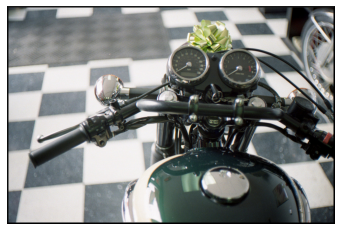

Question : what is above the gages?
Actual Answer:  bow
Top Predicted answers:  [('tree', 3.9441333), ('wall', 3.3716981), ('umbrella', 3.1017463), ('window', 2.9323854), ('nothing', 2.6909287)]
****************************************************************************************************


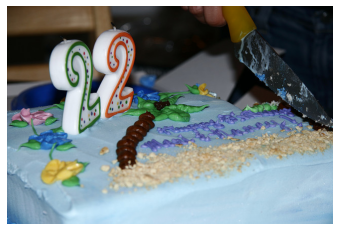

Question : what kind of dessert in pictured?
Actual Answer:  cake
Top Predicted answers:  [('pizza', 26.482317), ('cake', 16.27861), ('sandwich', 9.2316475), ('donut', 6.31314), ('donuts', 4.4313703)]
****************************************************************************************************


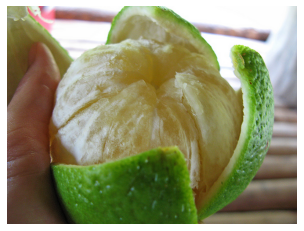

Question : what color is the skin of this fruit?
Actual Answer:  green
Top Predicted answers:  [('orange', 28.447033), ('green', 25.386671), ('yellow', 19.697664), ('red', 17.069416), ('blue', 3.2501724)]
****************************************************************************************************


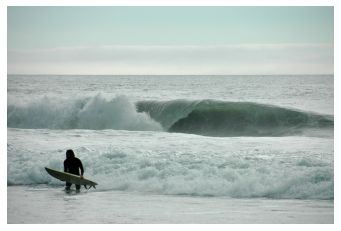

Question : how many people are in the sea?
Actual Answer:  1
Top Predicted answers:  [('1', 27.955135), ('2', 20.509703), ('3', 11.3811), ('0', 11.124088), ('4', 6.7448573)]
****************************************************************************************************


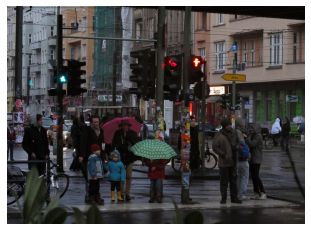

Question : what are the umbrellas protecting them from?
Actual Answer:  rain
Top Predicted answers:  [('sun', 40.36248), ('shade', 21.22557), ('rain', 13.191599), ('light', 3.743475), ('decoration', 3.5977812)]
****************************************************************************************************


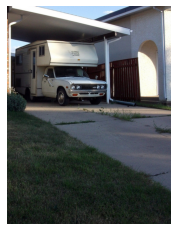

Question : what color is the house?
Actual Answer:  white
Top Predicted answers:  [('white', 43.24002), ('brown', 20.649424), ('red', 7.873832), ('gray', 6.927437), ('green', 5.7659006)]
****************************************************************************************************


In [29]:
generate_on_val(model)

In [ ]:
print_accuracy_metrics(model)

### Image-only attention

In [30]:
model = Build_ImageAttentionModel()
model.load_weights('/home/divyaj/Plots/models/resnet/image_attn.hdf5')

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


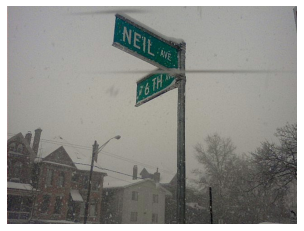

Question : What street does the sign say?
Top Predicted answers:  [('stop', 55.154617), ('stop sign', 6.520449), ('none', 4.577841), ('no', 3.5291932), ('yes', 3.3058133)]
****************************************************************************************************


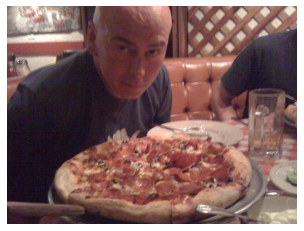

Question : How many slices of pizza are left?
Top Predicted answers:  [('4', 14.290304), ('3', 13.831946), ('2', 12.838955), ('1', 8.317562), ('5', 8.128921)]
****************************************************************************************************


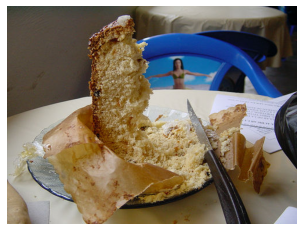

Question : Is that a person's leg in the background?
Top Predicted answers:  [('no', 53.299583), ('yes', 46.694103), ('red', 0.0010535984), ('green', 0.0009417665), ('brown', 0.00093612424)]
****************************************************************************************************


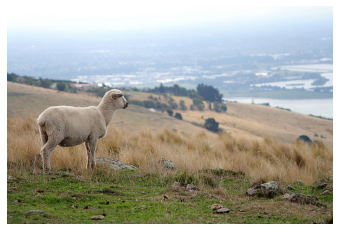

Question : Is the sheep posing?
Top Predicted answers:  [('no', 54.553734), ('yes', 45.44625), ('up', 1.1379605e-06), ('male', 1.0465083e-06), ('brown', 9.963479e-07)]
****************************************************************************************************


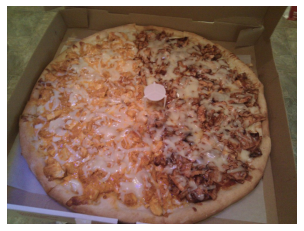

Question : Is this a pizza?
Top Predicted answers:  [('no', 51.604538), ('yes', 48.362373), ('red', 0.006084746), ('white', 0.0051044486), ('green', 0.004445688)]
****************************************************************************************************


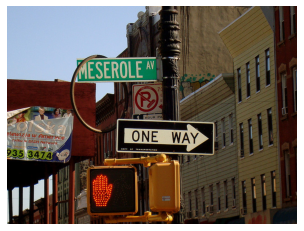

Question : How many sign posters are there?
Top Predicted answers:  [('2', 21.992311), ('1', 18.483118), ('3', 15.179044), ('4', 10.468175), ('5', 7.6382256)]
****************************************************************************************************


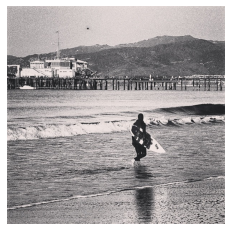

Question : Is the guy already done surfing?
Top Predicted answers:  [('yes', 58.088364), ('no', 41.889324), ('night', 0.010148475), ('male', 0.001678775), ('day', 0.0013202339)]
****************************************************************************************************


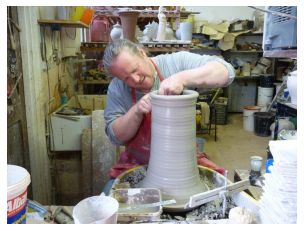

Question : Is the man using clay?
Top Predicted answers:  [('no', 52.664013), ('yes', 47.238247), ('bananas', 0.006954089), ('pillows', 0.0057825865), ('motorcycle', 0.0039108507)]
****************************************************************************************************


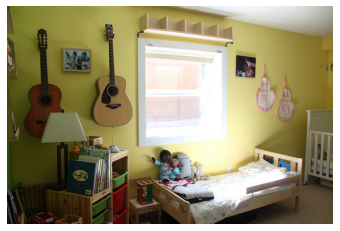

Question : What is the approximate age of the person who lives in this room?
Top Predicted answers:  [('0', 6.615357), ('10', 5.734497), ('5', 4.9129004), ('2', 4.7452164), ('1', 4.518263)]
****************************************************************************************************


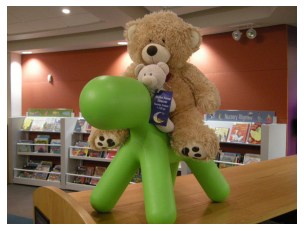

Question : Is this a toy shop?
Top Predicted answers:  [('no', 57.97683), ('yes', 42.022793), ('brown', 0.00012307602), ('white', 7.091819e-05), ('green', 3.5256155e-05)]
****************************************************************************************************


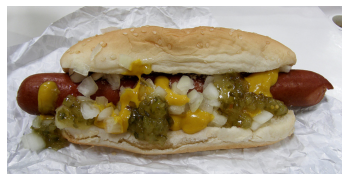

Question : Are there sesame seeds on the bun?
Top Predicted answers:  [('yes', 55.623047), ('no', 44.314823), ('1', 0.019893758), ('2', 0.009757828), ('0', 0.006055961)]
****************************************************************************************************


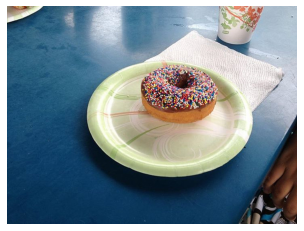

Question : What color are the donuts with the sprinkles?
Top Predicted answers:  [('white', 25.576162), ('green', 12.922963), ('red', 10.792264), ('blue', 10.264704), ('yellow', 9.495133)]
****************************************************************************************************


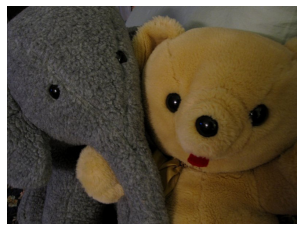

Question : Does the teddy bear have a heart shape on his nose?
Top Predicted answers:  [('yes', 51.22105), ('no', 48.335014), ('red', 0.086388424), ('green', 0.058949944), ('0', 0.053262018)]
****************************************************************************************************


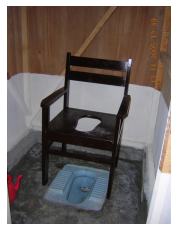

Question : Is the wall white?
Top Predicted answers:  [('yes', 51.63237), ('no', 47.98582), ('red', 0.07121322), ('0', 0.04942977), ('green', 0.04334783)]
****************************************************************************************************


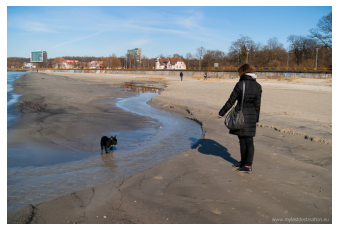

Question : Is this person on a beach?
Top Predicted answers:  [('yes', 50.793922), ('no', 49.184837), ('male', 0.005929695), ('female', 0.0038590378), ('1', 0.0014704821)]
****************************************************************************************************


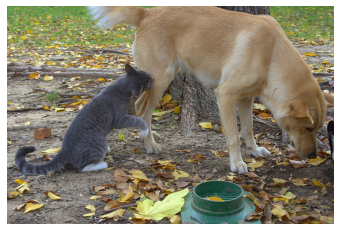

Question : Is the dog on a leash?
Top Predicted answers:  [('yes', 60.449047), ('no', 39.550903), ('down', 1.2770354e-05), ('up', 8.42332e-06), ('day', 5.9080753e-06)]
****************************************************************************************************


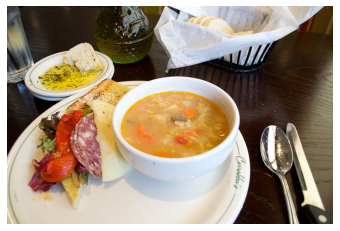

Question : What kind of soup is that?
Top Predicted answers:  [('chicken', 9.718494), ('pizza', 6.8963556), ('fish', 6.40029), ('hot dog', 4.8123026), ('none', 4.5626926)]
****************************************************************************************************


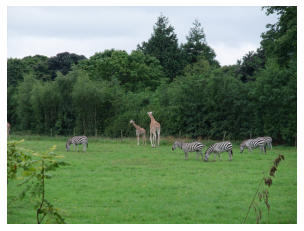

Question : Is there a  fence?
Top Predicted answers:  [('yes', 50.15099), ('no', 49.8489), ('white', 2.8413751e-05), ('green', 2.1174836e-05), ('brown', 1.735656e-05)]
****************************************************************************************************


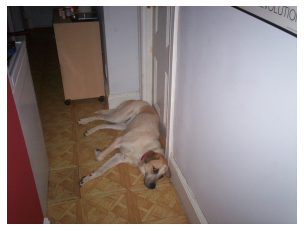

Question : Where is the red wall?
Top Predicted answers:  [('on wall', 8.232312), ('nowhere', 8.22554), ('wall', 7.962839), ('right', 6.783949), ('on left', 5.305872)]
****************************************************************************************************


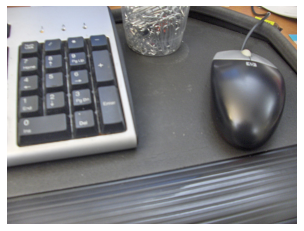

Question : Is that a genuine hp mouse?
Top Predicted answers:  [('no', 56.044926), ('yes', 43.954937), ('white', 5.1649164e-05), ('brown', 4.48432e-05), ('green', 1.0153422e-05)]
****************************************************************************************************


In [31]:
generate_on_test(model)

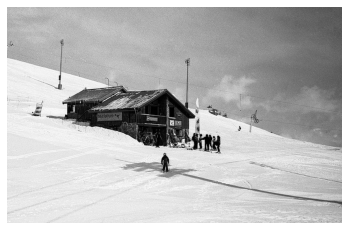

Question : is this a tropical location?
Actual Answer:  no
Top Predicted answers:  [('no', 56.45352), ('yes', 43.54648), ('brown', 4.185691e-08), ('white', 2.877406e-08), ('outside', 3.5349639e-09)]
****************************************************************************************************


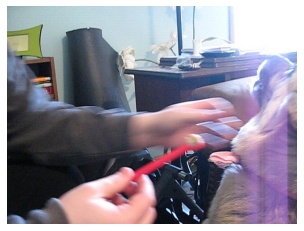

Question : is the dog happy?
Actual Answer:  no
Top Predicted answers:  [('yes', 79.76303), ('no', 20.236965), ('small', 1.0072835e-07), ('warm', 7.431905e-08), ('cold', 5.143082e-08)]
****************************************************************************************************


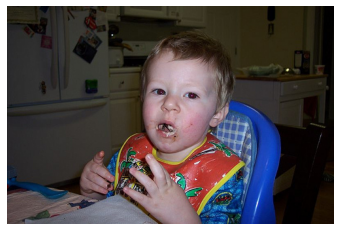

Question : what color shirt is the boy wearing?
Actual Answer:  blue
Top Predicted answers:  [('blue', 21.633242), ('white', 17.647951), ('black', 16.286678), ('red', 15.627989), ('green', 6.274573)]
****************************************************************************************************


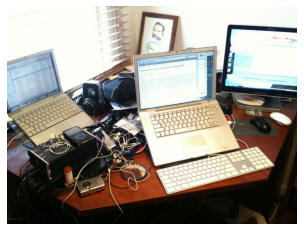

Question : is this a nice neat desk?
Actual Answer:  no
Top Predicted answers:  [('yes', 81.30687), ('no', 18.693125), ('small', 3.9156856e-09), ('warm', 2.8363032e-09), ('cold', 1.4609649e-09)]
****************************************************************************************************


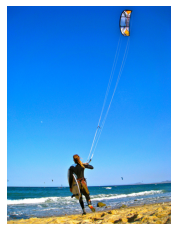

Question : what is this man flying?
Actual Answer:  kite
Top Predicted answers:  [('kite', 55.111427), ('plane', 14.38703), ('kites', 11.76611), ('frisbee', 6.9042726), ('airplane', 4.084555)]
****************************************************************************************************


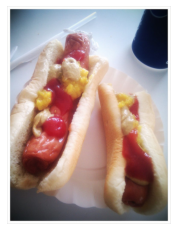

Question : what material is the plate made of?
Actual Answer:  paper
Top Predicted answers:  [('ceramic', 19.14131), ('glass', 18.808178), ('plastic', 17.455975), ('wood', 12.835116), ('metal', 11.429472)]
****************************************************************************************************


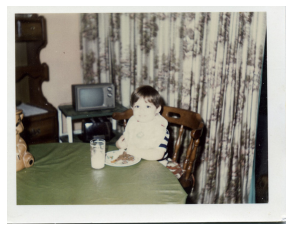

Question : what is the name of this boy?
Actual Answer:  mike
Top Predicted answers:  [('chef', 2.091179), ('wedding', 1.2845197), ('police', 1.110636), ('none', 1.0357356), ('birthday', 1.0279917)]
****************************************************************************************************


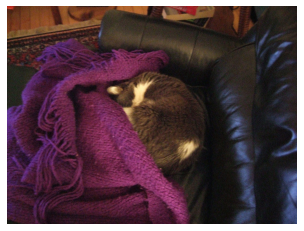

Question : what is the cat laying on?
Actual Answer:  couch
Top Predicted answers:  [('bed', 14.246747), ('suitcase', 10.00721), ('couch', 7.432139), ('chair', 7.1366606), ('laptop', 5.716302)]
****************************************************************************************************


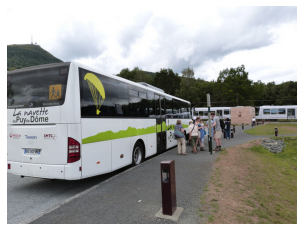

Question : that is the image in the back of the bus?
Actual Answer:  parachute
Top Predicted answers:  [('trees', 11.045893), ('building', 8.010474), ('mountains', 4.350867), ('fence', 4.046028), ('buildings', 4.0083995)]
****************************************************************************************************


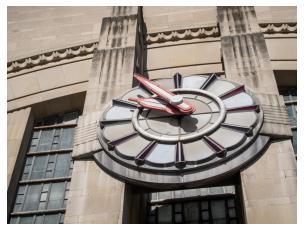

Question : what is the diameter of the clock?
Actual Answer:  5 feet
Top Predicted answers:  [('none', 5.1589875), ('0', 4.805721), ('unknown', 3.964693), ('fedex', 3.6802557), ('mercedes', 3.5442226)]
****************************************************************************************************


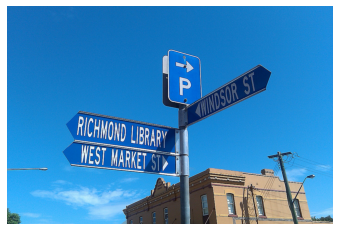

Question : what color are the signs?
Actual Answer:  blue
Top Predicted answers:  [('red', 17.05301), ('white', 16.617882), ('yellow', 13.621659), ('blue', 10.249087), ('red and white', 6.420716)]
****************************************************************************************************


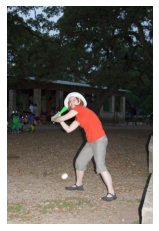

Question : is that a girl?
Actual Answer:  yes
Top Predicted answers:  [('no', 54.570133), ('yes', 45.429867), ('brown', 2.617429e-07), ('white', 1.8912564e-07), ('green', 1.134002e-08)]
****************************************************************************************************


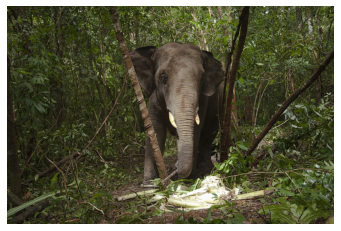

Question : what is this animal?
Actual Answer:  elephant
Top Predicted answers:  [('dog', 13.128919), ('giraffe', 12.945296), ('elephant', 12.238606), ('horse', 10.721168), ('cat', 10.567935)]
****************************************************************************************************


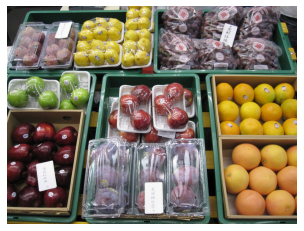

Question : are there any kiwi?
Actual Answer:  yes
Top Predicted answers:  [('yes', 65.74143), ('no', 34.258564), ('green', 1.6503613e-09), ('bananas', 5.5097127e-10), ('red', 2.207024e-10)]
****************************************************************************************************


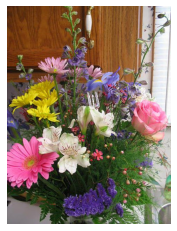

Question : is there a candle?
Actual Answer:  no
Top Predicted answers:  [('yes', 64.58405), ('no', 35.41595), ('green', 1.2766023e-08), ('red', 2.7601352e-09), ('bananas', 2.3373325e-09)]
****************************************************************************************************


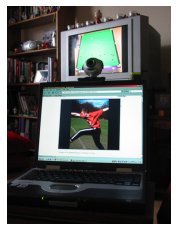

Question : where is the web camera?
Actual Answer:  on screen
Top Predicted answers:  [('nowhere', 7.36921), ('background', 4.8144083), ('outside', 4.719599), ('on ground', 4.6393127), ('right', 4.531398)]
****************************************************************************************************


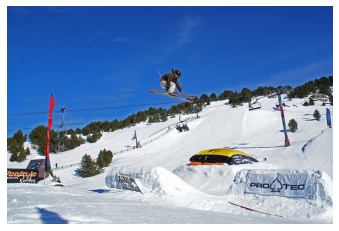

Question : what does the sign say?
Actual Answer:  pro tec
Top Predicted answers:  [('stop', 71.88074), ('one way', 5.772071), ('no parking', 3.96511), ('go', 3.3233702), ('stop sign', 1.5962007)]
****************************************************************************************************


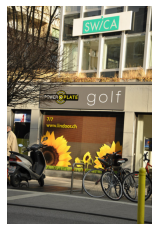

Question : what are the yellow flowers on the wall?
Actual Answer:  sunflowers
Top Predicted answers:  [('vase', 27.181519), ('rose', 13.227148), ('none', 7.2984443), ('daisy', 6.7947736), ('hats', 5.8068085)]
****************************************************************************************************


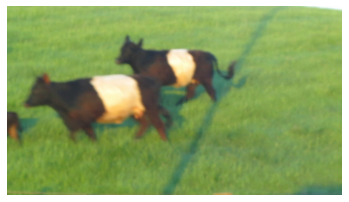

Question : how many cows are crossing the field?
Actual Answer:  3
Top Predicted answers:  [('1', 29.371527), ('2', 21.473217), ('0', 19.953758), ('3', 11.161083), ('4', 6.009864)]
****************************************************************************************************


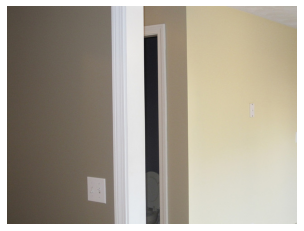

Question : is the paint on the wall new or chipped?
Actual Answer:  new
Top Predicted answers:  [('new', 44.902664), ('old', 23.272879), ('both', 11.611813), ('public', 2.6525502), ('small', 2.153493)]
****************************************************************************************************


In [32]:
generate_on_val(model)

In [ ]:
print_accuracy_metrics(model)

### Question-only attention

In [33]:
model = Build_QuesAttentionModel()
model.load_weights('/home/divyaj/Plots/models/resnet/ques_attn.hdf5')

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


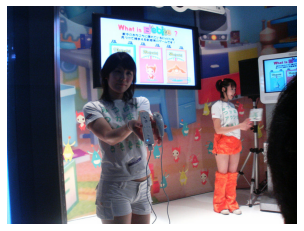

Question : What are the orange things on the woman's legs?
Top Predicted answers:  [('nothing', 5.2050633), ('flowers', 3.0942183), ('cat', 1.8646892), ('books', 1.5984502), ('food', 1.4664553)]
****************************************************************************************************


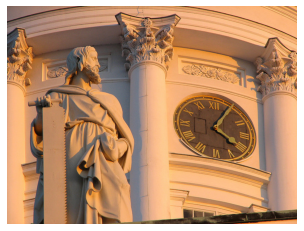

Question : Is this a real person?
Top Predicted answers:  [('yes', 50.57835), ('no', 49.412273), ('open', 0.002190597), ('closed', 0.0014223851), ('real', 0.0006781391)]
****************************************************************************************************


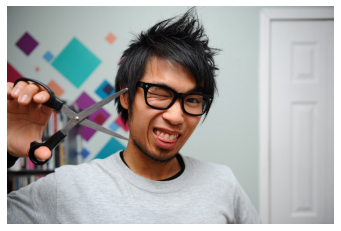

Question : What is the man looking at?
Top Predicted answers:  [('camera', 14.013609), ('tv', 7.676792), ('phone', 6.042254), ('laptop', 5.494751), ('food', 3.7327166)]
****************************************************************************************************


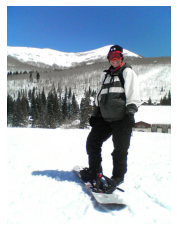

Question : Is the man skiing or snowboarding?
Top Predicted answers:  [('skiing', 45.400757), ('snowboarding', 37.763634), ('green', 3.784793), ('neither', 2.3447995), ('brown', 2.1503346)]
****************************************************************************************************


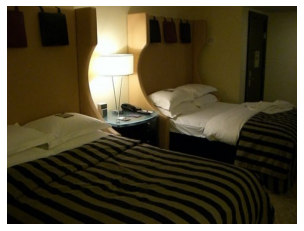

Question : Is the door open?
Top Predicted answers:  [('no', 51.208324), ('yes', 48.7379), ('open', 0.0069616414), ('right', 0.0048284787), ('closed', 0.0034037512)]
****************************************************************************************************


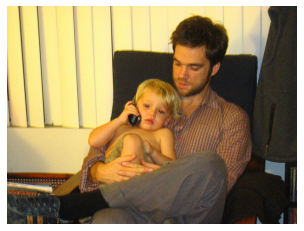

Question : Is there any window curtains behind the guy?
Top Predicted answers:  [('no', 50.480515), ('yes', 49.426685), ('open', 0.011942282), ('right', 0.007595466), ('closed', 0.00514788)]
****************************************************************************************************


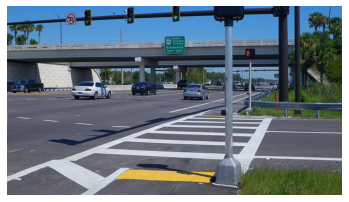

Question : Was this photo taken during the day?
Top Predicted answers:  [('yes', 55.593163), ('no', 44.051678), ('1', 0.08832205), ('2', 0.03480799), ('0', 0.025944036)]
****************************************************************************************************


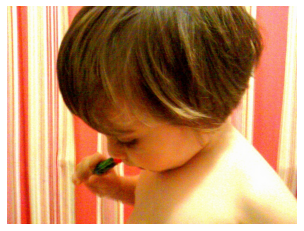

Question : What color is the baby's hair?
Top Predicted answers:  [('black', 30.874687), ('red', 17.273552), ('blue', 12.8098545), ('white', 10.517722), ('brown', 8.759784)]
****************************************************************************************************


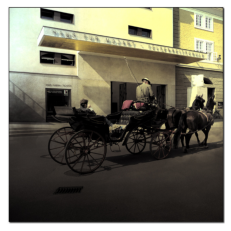

Question : Is it morning?
Top Predicted answers:  [('yes', 52.044933), ('no', 47.715466), ('open', 0.01830401), ('christmas', 0.01711008), ('winter', 0.012142736)]
****************************************************************************************************


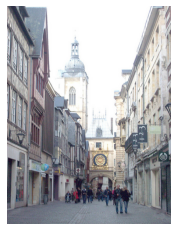

Question : Is that a busy street?
Top Predicted answers:  [('yes', 51.809406), ('no', 48.169796), ('open', 0.0047562295), ('closed', 0.0022831545), ('real', 0.001976539)]
****************************************************************************************************


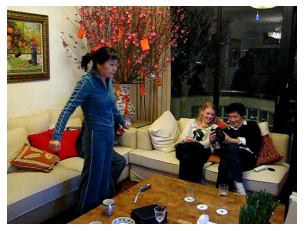

Question : Who is wearing blue?
Top Predicted answers:  [('man', 29.042658), ('woman', 18.929398), ('no', 6.894615), ('boy', 6.4399796), ('girl', 6.35465)]
****************************************************************************************************


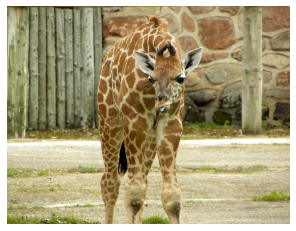

Question : Is the giraffe eating?
Top Predicted answers:  [('yes', 50.831657), ('no', 49.14477), ('open', 0.002831853), ('right', 0.002608534), ('winter', 0.0017142066)]
****************************************************************************************************


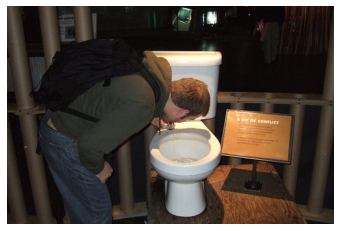

Question : What color is the man's sweater?
Top Predicted answers:  [('black', 20.662462), ('blue', 18.168875), ('red', 13.926838), ('white', 13.421965), ('green', 6.1935587)]
****************************************************************************************************


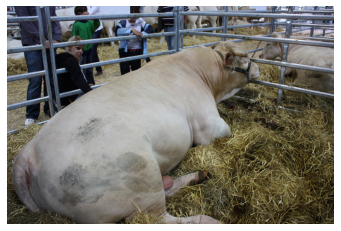

Question : What kind of animal is it?
Top Predicted answers:  [('dog', 13.316795), ('cat', 12.800484), ('giraffe', 12.229114), ('horse', 10.897118), ('elephant', 10.541989)]
****************************************************************************************************


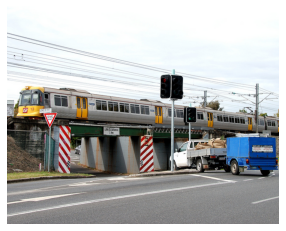

Question : What are the red and white stripes for?
Top Predicted answers:  [('birthday', 2.1612527), ('parking', 1.8550237), ('transportation', 1.7071866), ('shade', 1.6627302), ('flying', 1.5766141)]
****************************************************************************************************


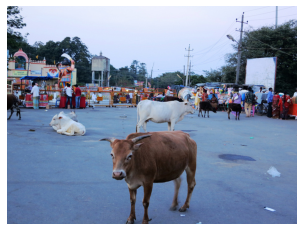

Question : What does this cow think he is doing in the city?
Top Predicted answers:  [('eating', 27.479378), ('standing', 24.327763), ('walking', 17.346544), ('grazing', 10.834252), ('sitting', 4.397516)]
****************************************************************************************************


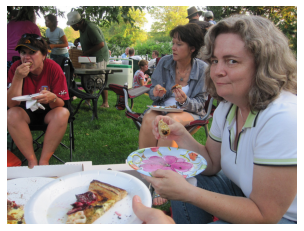

Question : What are the women drinking in the glasses?
Top Predicted answers:  [('wine', 25.220284), ('water', 18.12273), ('beer', 15.994514), ('coffee', 14.490984), ('milk', 5.5156)]
****************************************************************************************************


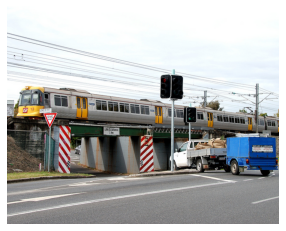

Question : Are the electric lines modern?
Top Predicted answers:  [('no', 51.528473), ('yes', 48.29311), ('right', 0.015890317), ('0', 0.014164809), ('left', 0.008791055)]
****************************************************************************************************


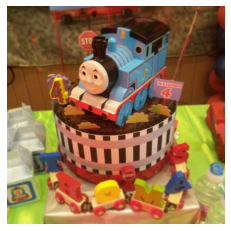

Question : What's the name of the toy on top?
Top Predicted answers:  [('none', 2.054402), ('phone', 1.6699845), ('laptop', 1.3832197), ('cat', 1.2213277), ('carrots', 1.1397787)]
****************************************************************************************************


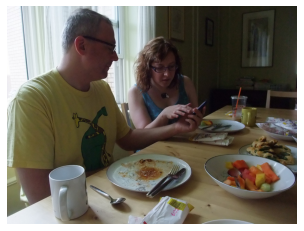

Question : What color is the plate in front of the man?
Top Predicted answers:  [('white', 52.6282), ('blue', 8.288632), ('black', 7.594744), ('brown', 5.836382), ('silver', 5.212516)]
****************************************************************************************************


In [34]:
generate_on_test(model)

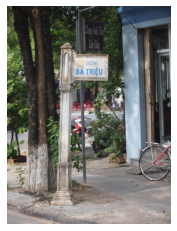

Question : what color are the plants?
Actual Answer:  green
Top Predicted answers:  [('green', 40.942703), ('red', 37.203854), ('yellow', 7.9608636), ('white', 5.480393), ('blue', 3.3148634)]
****************************************************************************************************


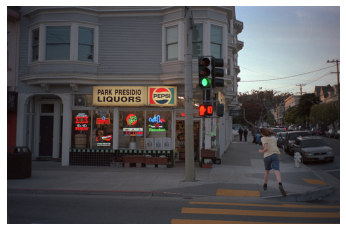

Question : what color is the light?
Actual Answer:  green
Top Predicted answers:  [('red', 49.74184), ('green', 37.772945), ('yellow', 7.6860332), ('white', 2.49146), ('blue', 0.8649513)]
****************************************************************************************************


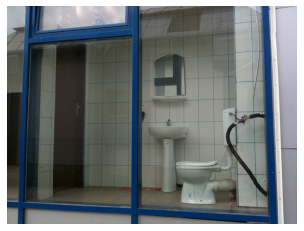

Question : is this a restroom?
Actual Answer:  yes
Top Predicted answers:  [('no', 50.61739), ('yes', 49.382378), ('open', 5.2631593e-05), ('closed', 3.7968523e-05), ('black and white', 1.6554442e-05)]
****************************************************************************************************


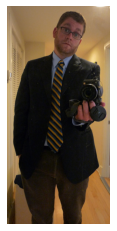

Question : is this man worried that he is not good-looking enough?
Actual Answer:  no
Top Predicted answers:  [('yes', 52.985573), ('no', 47.014378), ('sunny', 6.3827238e-06), ('male', 4.058379e-06), ('rainy', 3.7904886e-06)]
****************************************************************************************************


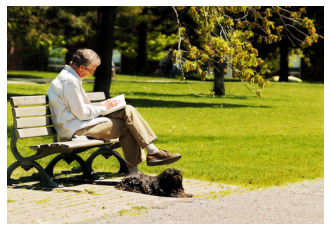

Question : is this old man eating food?
Actual Answer:  no
Top Predicted answers:  [('no', 55.87438), ('yes', 44.12505), ('open', 0.00012094557), ('closed', 0.00010540211), ('right', 6.492249e-05)]
****************************************************************************************************


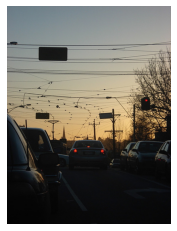

Question : where are the cars?
Actual Answer:  street
Top Predicted answers:  [('street', 7.4913664), ('background', 4.0991874), ('sidewalk', 3.7485096), ('beach', 3.5448842), ('sky', 3.5227022)]
****************************************************************************************************


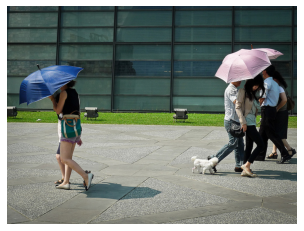

Question : does the girl have on platform shoes?
Actual Answer:  no
Top Predicted answers:  [('yes', 52.21418), ('no', 47.78581), ('jeans', 1.0114059e-06), ('black', 9.287397e-07), ('helmet', 7.140915e-07)]
****************************************************************************************************


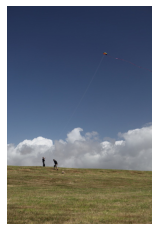

Question : how many people in the picture?
Actual Answer:  2
Top Predicted answers:  [('2', 21.402267), ('1', 20.054554), ('3', 14.633486), ('4', 10.093093), ('0', 8.4021635)]
****************************************************************************************************


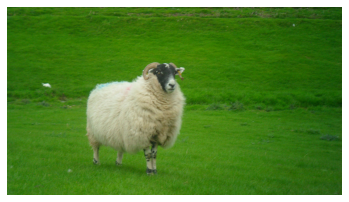

Question : what color is the grass?
Actual Answer:  green
Top Predicted answers:  [('green', 74.71315), ('brown', 24.634527), ('blue', 0.300705), ('gray', 0.2770544), ('white', 0.022923611)]
****************************************************************************************************


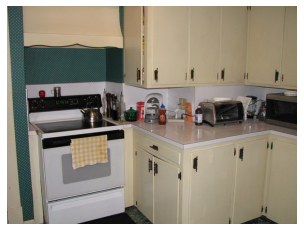

Question : are these vintage stoves?
Actual Answer:  no
Top Predicted answers:  [('yes', 51.76738), ('no', 48.226845), ('open', 0.0017581646), ('closed', 0.0010117852), ('real', 0.00032013367)]
****************************************************************************************************


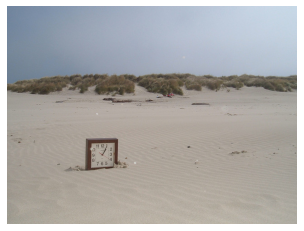

Question : is there water?
Actual Answer:  no
Top Predicted answers:  [('yes', 52.457344), ('no', 47.54251), ('sunny', 1.7694147e-05), ('male', 1.0891509e-05), ('rainy', 9.626345e-06)]
****************************************************************************************************


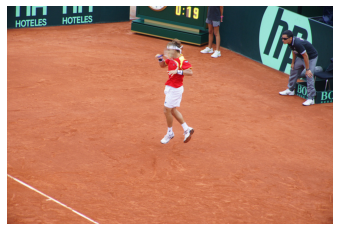

Question : what is the item called that this woman is wearing on her head?
Actual Answer:  headband
Top Predicted answers:  [('hat', 42.1835), ('helmet', 19.175056), ('hair', 9.00333), ('headband', 4.983545), ('sunglasses', 3.838319)]
****************************************************************************************************


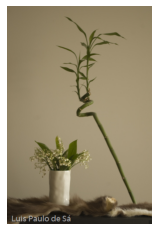

Question : what type of flower is this?
Actual Answer:  baby breath
Top Predicted answers:  [('roses', 26.208963), ('rose', 22.322332), ('daisy', 18.323696), ('tulips', 12.691122), ('lilies', 8.994514)]
****************************************************************************************************


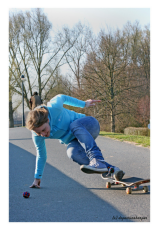

Question : who took this photograph?
Actual Answer:  friend
Top Predicted answers:  [('photographer', 41.669434), ('umpire', 13.019997), ('man', 9.375864), ('woman', 5.008073), ('no one', 3.8766727)]
****************************************************************************************************


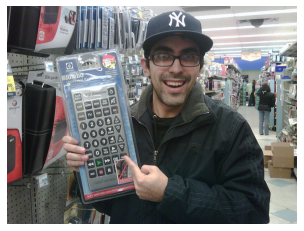

Question : what sport team hat is the man wearing?
Actual Answer:  yankees
Top Predicted answers:  [('tennis', 23.877127), ('baseball', 22.005894), ('frisbee', 12.811518), ('soccer', 10.940525), ('wii', 8.682899)]
****************************************************************************************************


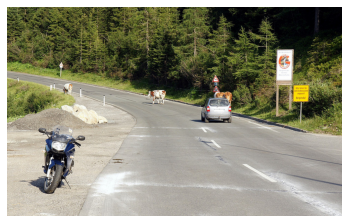

Question : how many cows in this photo?
Actual Answer:  3
Top Predicted answers:  [('2', 21.978603), ('1', 20.511192), ('3', 14.663002), ('4', 9.88763), ('0', 8.002573)]
****************************************************************************************************


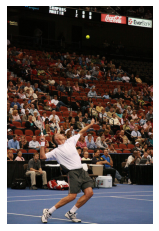

Question : what sport is this?
Actual Answer:  tennis
Top Predicted answers:  [('baseball', 31.601166), ('tennis', 31.034739), ('frisbee', 9.512569), ('soccer', 7.8607826), ('skiing', 5.789278)]
****************************************************************************************************


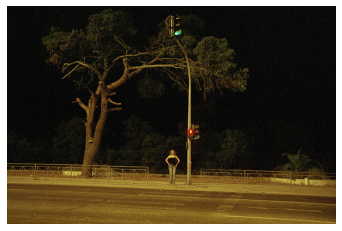

Question : is that a man or a woman near the traffic signal?
Actual Answer:  woman
Top Predicted answers:  [('man', 53.65927), ('woman', 45.859943), ('both', 0.16782697), ('no', 0.07538124), ('girl', 0.0698297)]
****************************************************************************************************


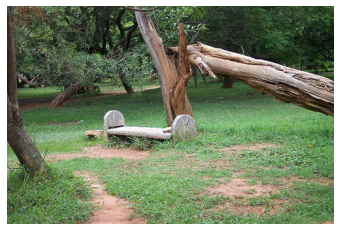

Question : are there any people around?
Actual Answer:  no
Top Predicted answers:  [('no', 51.910503), ('yes', 48.088615), ('open', 0.00034277528), ('closed', 0.00017211301), ('winter', 2.8008017e-05)]
****************************************************************************************************


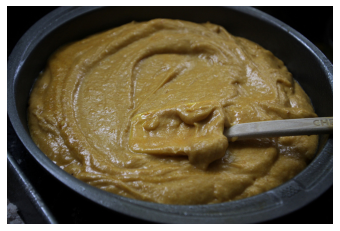

Question : what is this made of?
Actual Answer:  peanut butter
Top Predicted answers:  [('wood', 50.008022), ('metal', 17.064896), ('brick', 4.359985), ('stone', 3.9627287), ('plastic', 3.8341675)]
****************************************************************************************************


In [35]:
generate_on_val(model)

In [ ]:
print_accuracy_metrics(model)